# Find Wally Tutorial

In this exercise we are going to play the "Find wally" game. 

- **Inputs**: 
    You have 2 images, one with the Wally's profile, and another with the puzzle, were we should find Wally.

- **Expected result**:
    Visual location of Wally in the provided puzzle. 

## Requirements
You'll need the following libraries: 
- `ipykernel`
- `matplotlib`
- `opencv-python`
- `opencv-contrib-python`
- `nb_black`
- `ipympl`
- `scipy`
- `scikit-image`

## Guides
In the previous class, we introduced Local Features. 
This exercise is a great example of the one application of the local features, especially doe to its mental complexity. 

An option to implement this mini project is to: 
1. Find keypoints in both provided images
2. Build their descriptors
3. Match the descriptors between the 2 images
4. Run outlier removal algorithms to remove the incorrect matches.


In [ ]:
%load_ext lab_black
%load_ext autoreload
%autoreload 2
%matplotlib inline

# Important! 
The code below has a solution using the ORB and SIFT detection. The ORB is not successful in this case, but the SIFT is. So run the designated code blocks to see the results.

## 1. Read the input images

Steps: 
1. Read the two images
2. Convert them to RGB
3. Have a version of them in GrayScale

In [52]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os

imagesDir = './data/images' # Change this, according to your images' directory path

# Load the image
img_wallys_face = cv2.imread(os.path.join(imagesDir, "wally.png"))
img_find_wally = cv2.imread(os.path.join(imagesDir, "find_wally.jpeg"))

if img_wallys_face is None or img_find_wally is None:
    print("Error loading images")
    exit()

In [53]:
# --- YOUR CODE HERE, TO PREPARE THE IMAGE ---
img_wallys_face_gray = cv2.cvtColor(img_wallys_face, cv2.COLOR_BGR2GRAY)

img_find_wally_gray = cv2.cvtColor(img_find_wally, cv2.COLOR_BGR2GRAY)

Display the images:

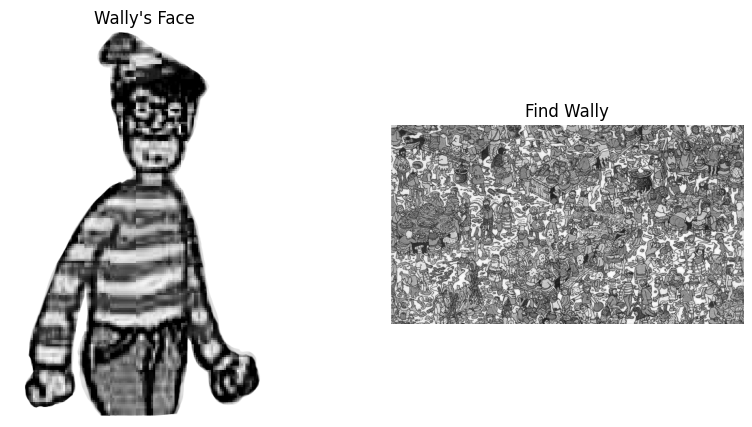

In [54]:
fx, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].set_title("Wally's Face")
ax[0].imshow(img_wallys_face_gray, cmap="gray")
ax[0].axis("off")

ax[1].set_title("Find Wally")
ax[1].imshow(img_find_wally_gray, cmap="gray")
ax[1].axis("off")
plt.show()

# Detect keypoints and create descriptor

During the class we mentioned SIFT, however you can use any algorithm for detection and description.

Steps: 
1. Find keypoints from the 2 grayscale images
2. Store their descriptors 

In [6]:
# --- YOUR CODE HERE, TO PREPARE DETECT THE KEYPOINTS, AND RESPECTIVE DESCRIPTORS ---
# Since we already used SIFT in week4.ipynb, we will use ORB instead

# Initiate ORB detector
orb = cv2.ORB_create()

# find the keypoints with ORB
kp_query = orb.detect(img_wallys_face_gray, None)
kp_train = orb.detect(img_find_wally_gray, None)

# compute the descriptors with ORB
kp_query, desc_query = orb.compute(img_wallys_face_gray, kp_query)
kp_train, desc_train = orb.compute(img_find_wally_gray, kp_train)

In [55]:
# Use SIFT detector
sift = cv2.SIFT_create()
# kp -> List of keypoints
# desc -> Numpy array of shape (number of keypoints, 128) - descriptors
kp_query_sift, desc_query_sift = sift.detectAndCompute(img_wallys_face_gray, None)
kp_train_sift, desc_train_sift = sift.detectAndCompute(img_find_wally_gray, None)

Draw keypoints in pattern's image - Wally's image.

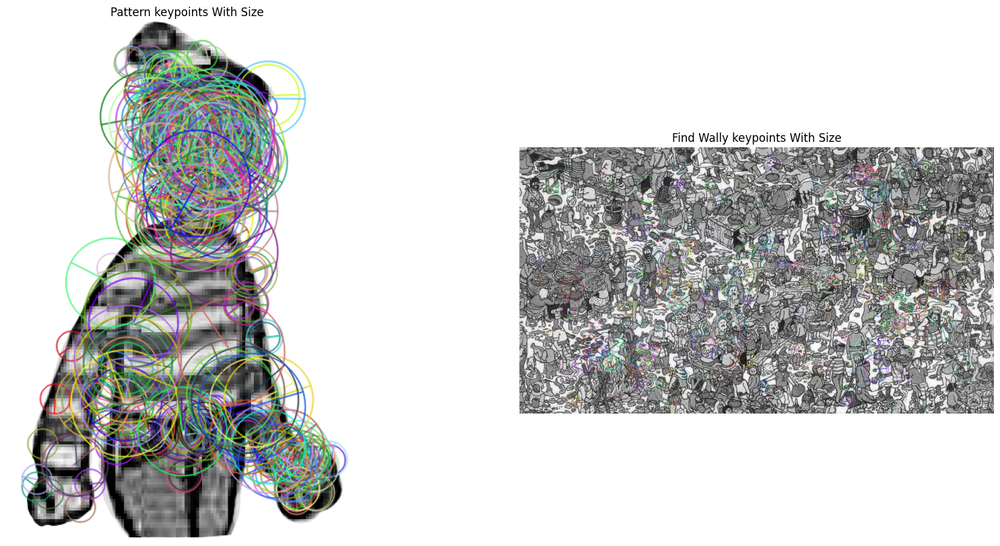

Number of Keypoints Detected In Wally's Image:  500


In [8]:
# Wally's face
keypoints_with_size = np.copy(img_wallys_face)

cv2.drawKeypoints(
    img_wallys_face_gray,
    kp_query,
    keypoints_with_size,
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS,
)

# Find Wally board
keypoints_with_size_find_wally = np.copy(img_find_wally)

cv2.drawKeypoints(
    img_find_wally_gray,
    kp_train,
    keypoints_with_size_find_wally,
    flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS,
)

# Print
fx, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].set_title("Pattern keypoints With Size")
ax[0].imshow(keypoints_with_size, cmap="gray")
ax[0].axis("off")

ax[1].set_title("Find Wally keypoints With Size")
ax[1].imshow(keypoints_with_size_find_wally, cmap="gray")
ax[1].axis("off")
plt.show()

# Print the number of keypoints detected in the wally image
print("Number of Keypoints Detected In Wally's Image: ", len(kp_query))

## Match the descriptors between the 2 images - find correspondence

In [25]:
# --- YOUR CODE HERE, TO PREPARE MATCH THE DESCRIPTORS BETWEEN THE 2 IMAGES ---
# Create Brute-Force Matcher object.
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Match descriptors.
matches = bf.match(desc_query, desc_train)

# Sort them in the order of their distance.
matches = sorted(matches, key=lambda x: x.distance)

# Use only the best matches
matches = matches[:100]



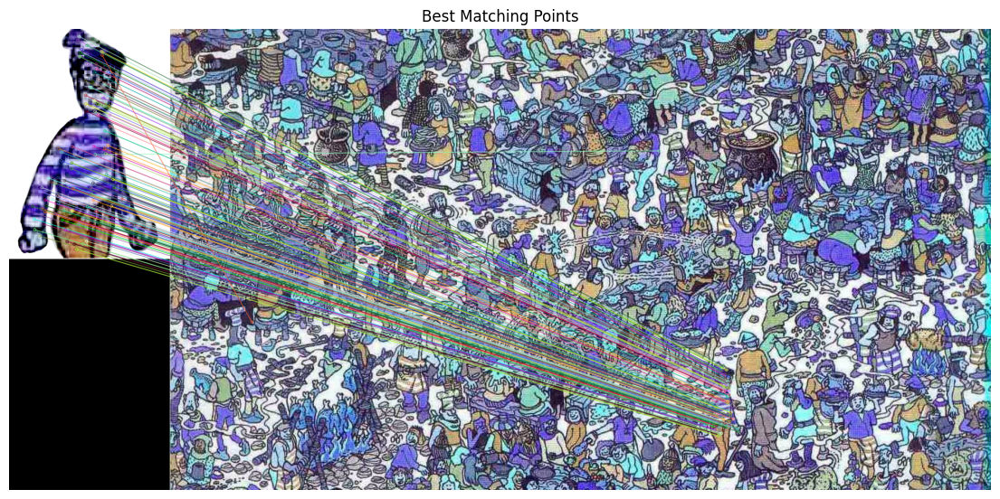


Number of Matching Keypoints Between The Training and Query Images:  127


In [56]:
# Use FLANN-based Matcher with SIFT
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)   # or pass empty dictionary
matcher = cv2.FlannBasedMatcher(index_params, search_params)
matches = matcher.knnMatch(desc_query_sift, desc_train_sift, k=2)

# Select good matches using the ratio test
# In this case, we will use the Lowe's ratio test
ratio_thresh = 0.75
good_matches = []
for m, n in matches:
    if m.distance < ratio_thresh * n.distance:
        good_matches.append(m)

# Draw the matches & returns an output image that concatenates the two input images and draws the matches
matchOut = cv2.drawMatches(img_wallys_face, kp_query_sift, img_find_wally, kp_train_sift, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# Display the best matching points
plt.rcParams["figure.figsize"] = [14.0, 7.0]
plt.title("Best Matching Points")
plt.imshow(matchOut)
plt.axis("off")
plt.show()

# Print total number of matching points between Wally and the puzzle board
print(
    "\nNumber of Matching Keypoints Between The Training and Query Images: ",
    len(good_matches),
)

Print the matches (ORB)

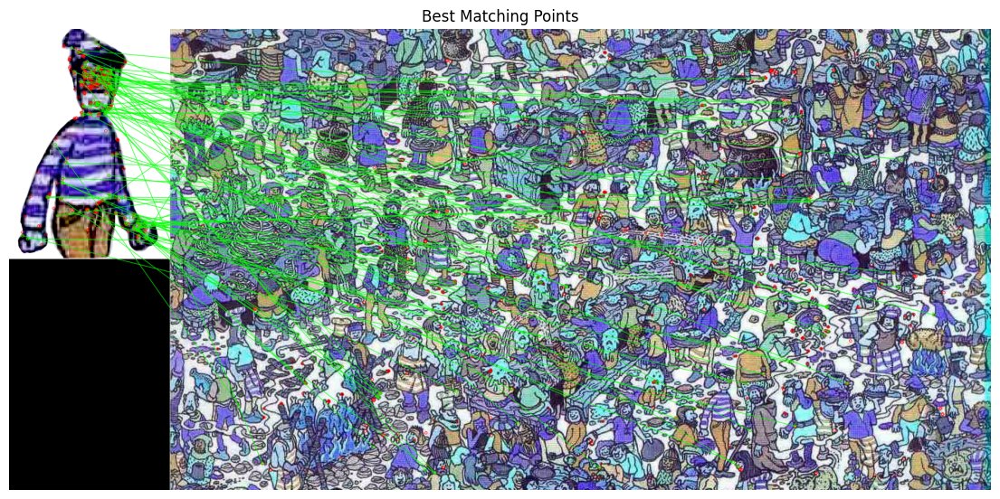


Number of Matching Keypoints Between The Training and Query Images:  100


In [26]:
draw_params = dict(matchColor = (0,255,0), singlePointColor = (255,0,0), flags = cv2.DrawMatchesFlags_DEFAULT)

result = cv2.drawMatches(
    img_wallys_face,
    kp_query,
    img_find_wally,
    kp_train,
    matches,
    None,
    **draw_params,
)

# Display the best matching points
plt.rcParams["figure.figsize"] = [14.0, 7.0]
plt.title("Best Matching Points")
plt.imshow(result)
plt.axis("off")
plt.show()

# Print total number of matching points between Wally and the puzzle board
print(
    "\nNumber of Matching Keypoints Between The Training and Query Images: ",
    len(matches),
)

We can see that a lot of matches are incorrect. So we need a way to remove the outliers.

## Remove the incorrect matches / outliers

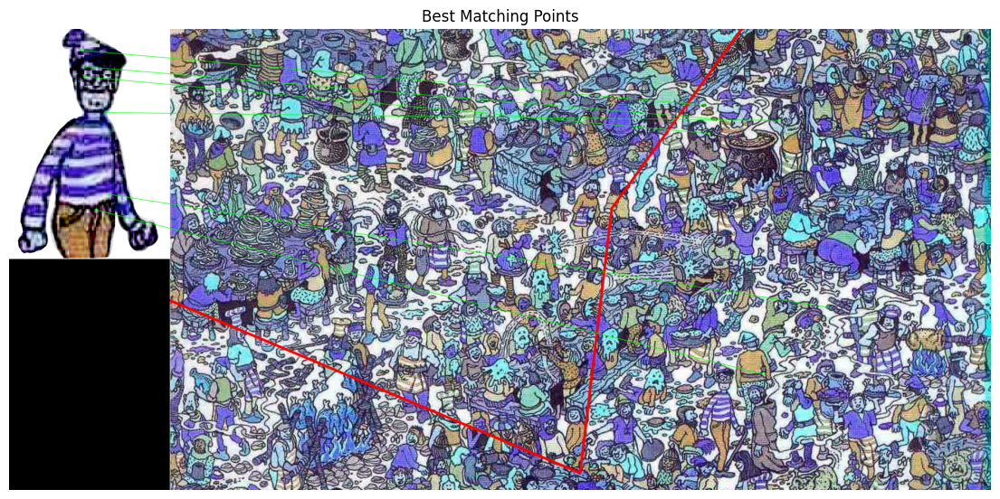

In [29]:
# --- YOUR CODE HERE, REMOVE THE INCORRECT MATCHES / OUTLIERS ---
# use RANSAC to remove outliers

# Store the coordinates of the matching keypoints for the query and train images
src_pts = np.float32([kp_query[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
dst_pts = np.float32([kp_train[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

# Find homography
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
matchesMask = mask.ravel().tolist() # mask.ravel() returns contiguous flattened array

# Use homography
h, w = img_wallys_face_gray.shape
pts = np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(-1, 1, 2)
dst = cv2.perspectiveTransform(pts, M)


See the result:

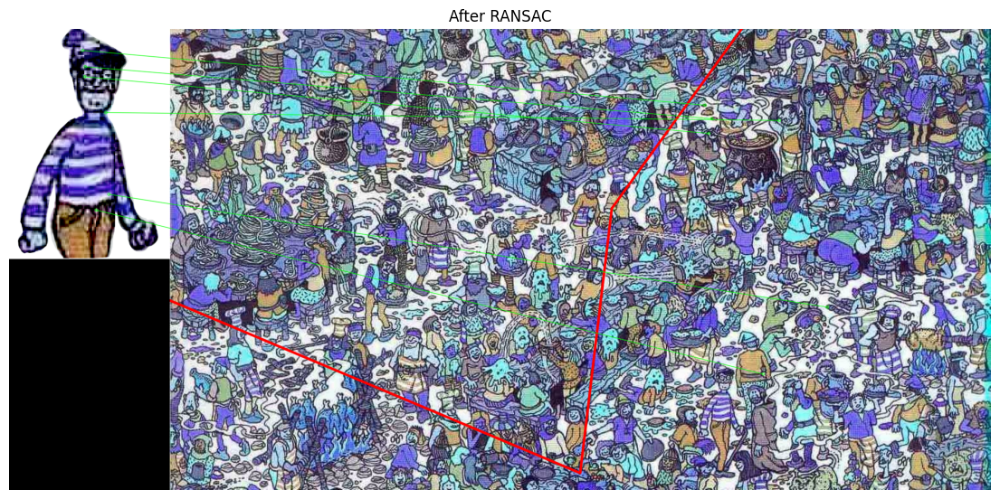

In [30]:
draw_params = dict(matchColor = (0,255,0), singlePointColor = None, matchesMask = matchesMask, flags = 2)
img_wally_found = cv2.drawMatches(
    img_wallys_face,
    kp_query,
    img_find_wally,
    kp_train,
    matches,
    None,
    **draw_params,
)

# Display the best matching points
plt.rcParams["figure.figsize"] = [14.0, 7.0]
plt.title("After RANSAC")
plt.imshow(img_wally_found)
plt.axis("off")
plt.show()

Remove the incorrect matches (RANSAC) and localize Wally. (SIFT)

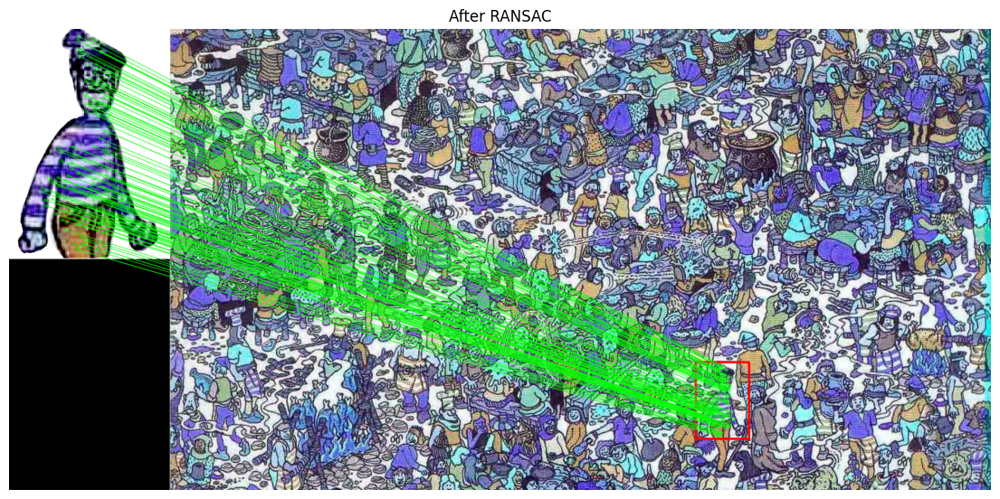

In [57]:
# Localize the object
# Store the coordinates of the matching keypoints for the query and train images
src_pts = np.float32([kp_query_sift[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)    # When using -1, the other dimension is automatically calculated
dst_pts = np.float32([kp_train_sift[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

# Find homography
H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC)
matchesMask = mask.ravel().tolist() # mask.ravel() returns contiguous flattened array

# Use homography
h, w = img_wallys_face_gray.shape
pts = np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(-1, 1, 2)
dst = cv2.perspectiveTransform(pts, H)  # dst is the bounding box representing the query object in the train image

# Draw bounding box in red
img2 = cv2.polylines(img_find_wally, [np.int32(dst)], True, 255, 3, cv2.LINE_AA)

# Draw the matches in green
draw_params = dict(matchColor = (0,255,0), singlePointColor = None, matchesMask = matchesMask, flags = 2)
img_matches = cv2.drawMatches(img_wallys_face, kp_query_sift, img2, kp_train_sift, good_matches, None, **draw_params)

# Display the best matching points
# clear the plt figure
plt.clf()
plt.rcParams["figure.figsize"] = [14.0, 7.0]
plt.title("After RANSAC")
plt.imshow(img_matches)
plt.axis("off")
plt.show()


